## Olivetti faces dataset using K-Means 

In [1]:
from sklearn.datasets import fetch_olivetti_faces

faces = fetch_olivetti_faces()
X = faces['data']
y = faces['target']

In [2]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, stratify=y)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=(1/9), stratify=y_train)

In [3]:
import numpy as np

print(len(np.unique(y_val)) == len(np.unique(y_test)))

True


In [4]:
from sklearn.cluster import KMeans

inertia_values = []
n_clusters = list(range(5, 55, 5))
for cluster in n_clusters:
    kmeans = KMeans(n_clusters=cluster)
    kmeans.fit(X_train)
    inertia_values.append(kmeans.inertia_)

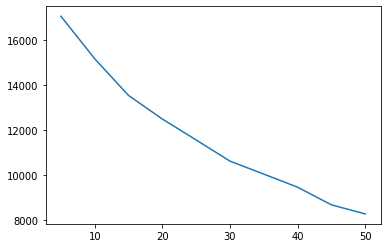

In [5]:
import matplotlib.pyplot as plt

plt.plot(n_clusters, inertia_values)
plt.show()

In [6]:
for i in range(len(inertia_values) - 1):
    print(n_clusters[i + 1],inertia_values[i] - inertia_values[i + 1])

10 1897.42578125
15 1635.333984375
20 1052.3251953125
25 933.5029296875
30 943.8671875
35 578.921875
40 582.826171875
45 788.76953125
50 402.80859375


In [7]:
inertia_values = []
n_clusters = list(range(35, 50))
for cluster in n_clusters:
    kmeans = KMeans(n_clusters=cluster)
    kmeans.fit(X_train)
    inertia_values.append(kmeans.inertia_)

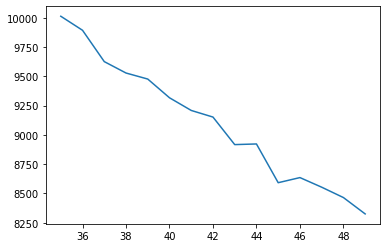

In [8]:
plt.plot(n_clusters, inertia_values)
plt.show()

In [9]:
kmeans = KMeans(n_clusters=40).fit(X_train)
km_labels = kmeans.labels_

In [11]:
X_train_reshape = X_train.reshape(320, 64, 64)

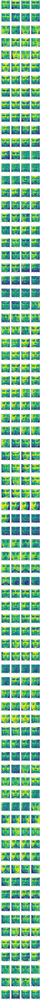

In [12]:
fig = plt.figure(figsize=(12, 320))
columns = 4
rows = 80
n_picture = 1
for n_label in range(len(np.unique(km_labels))):
    cluster = X_train_reshape[km_labels == n_label]
    for count, picture in enumerate(cluster):
        fig.add_subplot(rows, columns, count + n_picture)
        plt.text(10, 55 ,f'Cluster #{n_label}', fontsize=14)
        plt.imshow(picture)
    n_picture += len(cluster)

In [13]:
from sklearn.linear_model import SGDClassifier

sgd_clf = SGDClassifier()
sgd_clf.fit(X_train, y_train)

SGDClassifier()

In [14]:
sgd_pred = sgd_clf.predict(X_train)

In [15]:
from sklearn.metrics import accuracy_score

accuracy_score(sgd_pred, y_train)

0.91875

In [16]:
sgd_pred = sgd_clf.predict(X_val)
accuracy_score(sgd_pred, y_val)

0.8

In [17]:
from sklearn.pipeline import Pipeline

pipeline = Pipeline([
    ('kmeans', KMeans(n_clusters=40)),
    ('sgd_clf', SGDClassifier()),
])
pipeline.fit(X_train, y_train)

Pipeline(steps=[('kmeans', KMeans(n_clusters=40)),
                ('sgd_clf', SGDClassifier())])

In [18]:
pipeline.score(X_val, y_val)

0.45

Try Gaussian mixture with olivetti dataset

In [19]:
from sklearn.decomposition import PCA

pca = PCA(n_components=0.99)
pca.fit(X_train)

PCA(n_components=0.99)

In [20]:
X_train_pca = pca.transform(X_train)

In [21]:
from sklearn.mixture import GaussianMixture

gm_clf = GaussianMixture()
gm_clf.fit(X_train_pca)

GaussianMixture()

In [22]:
random_img = gm_clf.sample(20)

In [23]:
random_images = np.zeros(shape=(20, 64, 64))
for count, img in enumerate(random_img[0]):
    random_images[count] = pca.inverse_transform(img).reshape(64,64)

In [24]:
random_images[:2] = np.flip(random_images[:2])

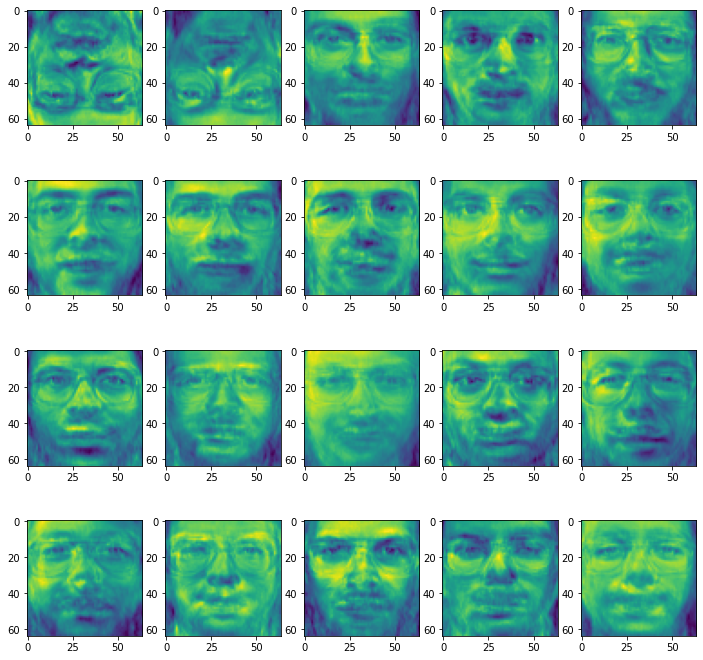

In [25]:
fig = plt.figure(figsize=(12, 12))
columns = 5
rows = 4
for count, picture in enumerate(random_images):
    fig.add_subplot(rows, columns, count + 1)
    plt.imshow(picture)

In [38]:
random_img = pca.transform(random_images.reshape(20, -1))
densities = gm_clf.score_samples(random_img)
density_threshold = np.percentile(densities, 10)
anomalies = random_img[densities < density_threshold]

In [40]:
densities < density_threshold

array([ True,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False])

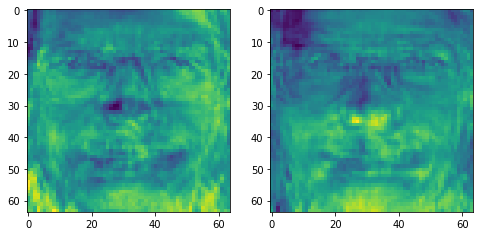

In [35]:
anomalies_img = pca.inverse_transform(anomalies).reshape(2, 64, 64)
fig = plt.figure(figsize=(8, 8))
fig.add_subplot(1, 2, 1)
plt.imshow(anomalies_img[0])
fig.add_subplot(1, 2, 2)
plt.imshow(anomalies_img[1])

In [51]:
random_images_pca = pca.inverse_transform(random_img)
for mse in (random_images.reshape(20, -1) - random_images_pca):
    print(mse.mean())

0.0006127282419836089
0.0004583714883257574
-6.927641625026977e-10
2.4895218444918226e-09
2.384890120349874e-08
1.190888553603695e-08
-2.5402425547333643e-08
-4.467130725521523e-11
-4.0887635951373895e-08
4.489545681175637e-09
-2.2970945525782052e-07
2.864542012401668e-08
1.0603046882799705e-07
3.6652966628125607e-08
4.331603394961976e-08
-8.303122018360292e-08
5.796110024070309e-08
-7.796641716767904e-09
8.224715339646656e-08
7.796195919684167e-08


In [27]:
random_img = gm_clf.sample(320)
gm_clf.score_samples(random_img[0]).max()

-1.3689655640064302